# Covid-19 Predictions and Analysis

The goal of this project is to compare how well Canadian provinces are handling the COVID-19 breakout with respect to eachother (specifically Quebec and British Columbia and to compare Canadian COVID-19 numbers with other countries who have been severely affected by the pandemic in hopes of gaining insight into the future (and hopefully end) of Canada's outbreak using pandas, numpy, and data visualizations created with seaborn and plotly. In addition, I will predict the total number of cases, deaths, and recoveries globally over the 7 days using prophet. 

In [176]:
import matplotlib

In [177]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import chart_studio.plotly as py
import plotly.express as px

from datetime import datetime

%matplotlib inline

In [178]:
from plotly import __version__
import plotly.graph_objs as go 
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot

print(__version__) # requires version >= 1.9.0
import cufflinks as cf
# For Notebooks
init_notebook_mode(connected=True)
# For offline use
cf.go_offline()

4.6.0


In [179]:
# Daily number of confirmed cases, deaths, and recoveries globally
conf_g = pd.read_csv('csv_files/JH/time_series_covid19_confirmed_global.csv')
death_g = pd.read_csv('csv_files/JH/time_series_covid19_deaths_global.csv')
recov_g = pd.read_csv('csv_files/JH/time_series_covid19_recovered_global.csv')

# don't use your cleaned sheet, practice cleaning here: prov, prov_latlong, dfcan
# dfcan = pd.read_excel('csv_files/Canada Covid19 Clean.xlsx')

In [180]:
conf_g.sort_values(by=['Country/Region','Province/State'],inplace=True)
death_g.sort_values(by=['Country/Region','Province/State'],inplace=True)
recov_g.sort_values(by=['Country/Region','Province/State'],inplace=True)

Convert global confirmed cases, deaths, and recovered into long table format

In [181]:
def long_format(old_df, kind):
    df = old_df.drop(['Lat','Long'],axis=1)
    df = df.set_index(['Province/State', 'Country/Region'])
    df = df.stack().to_frame()
    df.rename(columns={0:kind},inplace=True)
    df.reset_index(inplace=True)
    df.rename(columns={'level_2':'Date','Province/State':'Province','Country/Region':'Country'},inplace=True)
    df['Date'] = df['Date'].apply(lambda x: datetime.strptime(x, '%m/%d/%y'))
    df.set_index(['Province', 'Country','Date'],inplace=True)
    return df

In [182]:
cases_long = long_format(conf_g,'Cases')
deaths_long = long_format(death_g,'Deaths')
recovered_long = long_format(recov_g,'Recovered')

##### Combine cases, deaths, and recovered into 1 table: 
- recovered data does not specify numbers by Canadian province, therefore need to combine Canadian provinces in the confirmed cases and deaths, and only then can you combing these 3 tables)
- combine just confirmed cases and deaths in one table to have access to Canadian provinces

###### Global cases versus deaths over time (includes Canada broken down into provinces)

In [183]:
global_cases_vs_deaths = pd.concat([cases_long,deaths_long],axis=1)

global_cases_vs_deaths.reset_index(inplace=True)
global_cases_vs_deaths.head()

,Province,Country,Date,Cases,Deaths
0,NaN,Afghanistan,2020-01-22,0,0
1,NaN,Afghanistan,2020-01-23,0,0
2,NaN,Afghanistan,2020-01-24,0,0
3,NaN,Afghanistan,2020-01-25,0,0
4,NaN,Afghanistan,2020-01-26,0,0


###### Global cases, deaths, recovered over time (Canada is not broken down by province/territory)

Recovered data DOES NOT break down Canada into provinces, therefore to combine all confirmed cases, deaths, and recovery data for all countries, Canadian province data must be grouped into Canada as a whole for confirmed cases and deaths.

In [184]:
def condense_canada(old_df):
    condense_can = old_df.copy()
    condense_can.reset_index(inplace=True)
    temp = condense_can[condense_can['Country']=='Canada'].groupby('Date').sum()
    temp['Country'] = 'Canada'
    temp['Province'] = float('NaN')
    temp.head()
    temp.reset_index(inplace=True)
    can_dropped = condense_can.set_index('Country').drop(index='Canada')
    can_dropped.reset_index(inplace=True)
    can_dropped = can_dropped.append(temp)
    can_dropped.sort_values(by=['Country','Province'],inplace=True)
    can_dropped.set_index(['Province','Country','Date'],inplace=True)
    return can_dropped

In [185]:
cases_no_can_provs = condense_canada(cases_long)
deaths_no_can_provs = condense_canada(deaths_long)

In [186]:
global_nums = pd.concat([cases_no_can_provs,deaths_no_can_provs,recovered_long],axis=1)
global_nums.head()

Cases  Deaths  Recovered
Province Country     Date                                
NaN      Afghanistan 2020-01-22      0       0          0
                     2020-01-23      0       0          0
                     2020-01-24      0       0          0
                     2020-01-25      0       0          0
                     2020-01-26      0       0          0

###### Read in data from other countries

In [187]:
CAN_daily = pd.read_excel('csv_files/Canada International Daily.xlsx',sheet_name='Canada',parse_dates=True)
ITA_daily = pd.read_excel('csv_files/Canada International Daily.xlsx',sheet_name='Italy')
KOR_daily = pd.read_excel('csv_files/Canada International Daily.xlsx',sheet_name='South Korea')
SWE_daily = pd.read_excel('csv_files/Canada International Daily.xlsx',sheet_name='Sweden')
USA_daily = pd.read_excel('csv_files/Canada International Daily.xlsx',sheet_name='United States')
GBR_daily = pd.read_excel('csv_files/Canada International Daily.xlsx',sheet_name='United Kingdom')
CHN_daily = pd.read_excel('csv_files/Canada International Daily.xlsx',sheet_name='China')
CN_HB_daily = pd.read_excel('csv_files/Canada International Daily.xlsx',sheet_name='Hubei')

In [188]:
KOR_daily.head()
# type(CAN_daily['Date'].loc[0])

,Date,TotalCases,Days since 100th case
0,2020-01-22,1,0
1,2020-01-23,1,0
2,2020-01-24,2,0
3,2020-01-25,2,0
4,2020-01-26,3,0


Transform data to get Date and Province/State Columns for Canadian Provinces only.

In [189]:
def can_provinces(transform_df):
    df = transform_df[transform_df['Country/Region'] =='Canada'].drop(['Lat','Long','Country/Region'],axis=1)
    df = df.transpose()
    df.columns = df.loc['Province/State']
    df.drop(['Province/State'],inplace=True)
    df.reset_index(inplace=True)
    df.rename(columns={'index':'Date'},inplace=True)
    df['Date'] = df['Date'].apply(lambda x: datetime.strptime(x, '%m/%d/%y'))
    return df

In [190]:
# Canadian dailyconfirmed cases, deaths, recovered by province (columns) and a date column

conf_time_can = can_provinces(conf_g)
death_time_can = can_provinces(death_g)
recov_time_can = can_provinces(recov_g)

conf_time_can.head()

Province/State,Date,Alberta,British Columbia,Diamond Princess,Grand Princess,Manitoba,New Brunswick,Newfoundland and Labrador,Northwest Territories,Nova Scotia,Ontario,Prince Edward Island,Quebec,Recovered,Saskatchewan,Yukon
0,2020-01-22,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,2020-01-23,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,2020-01-24,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,2020-01-25,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,2020-01-26,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0


# Canada

Read in data from Esri Canada

In [191]:
province_daily = pd.read_csv('csv_files/CovidCanada/Provincial_Daily_Totals.csv')
# province_totals.rename(columns={'Province':'Province/Territory'},inplace=True)

# Get Province in title format
# a = province_daily.sort_values(['Province','Date'])

In [192]:
province_daily.head()

,SummaryDate,OBJECTID,Province,Abbreviation,DailyTotals,TotalCases,TotalRecovered,DailyRecovered,TotalDeaths,DailyDeaths,TotalTested,DailyTested,TotalActive,DailyActive,TotalHospitalized,DailyHospitalized,TotalICU,DailyICU
0,2020/01/25 12:00:00+00,1,ALBERTA,AB,0,0,0,0,0,0,0,0,0,0.0,NaN,NaN,NaN,NaN
1,2020/01/25 12:00:00+00,2,NWT,NT,0,0,0,0,0,0,0,0,0,0.0,NaN,NaN,NaN,NaN
2,2020/01/25 12:00:00+00,3,YUKON,YT,0,0,0,0,0,0,0,0,0,0.0,NaN,NaN,NaN,NaN
3,2020/01/25 12:00:00+00,4,SASKATCHEWAN,SK,0,0,0,0,0,0,0,0,0,0.0,NaN,NaN,NaN,NaN
4,2020/01/25 12:00:00+00,5,PEI,PE,0,0,0,0,0,0,0,0,0,0.0,NaN,NaN,NaN,NaN


Create a heatmap of all of the columns' pairwise correlations to get an idea of new features that could be useful.

Index(['SummaryDate', 'OBJECTID', 'Province', 'Abbreviation', 'DailyTotals',
       'TotalCases', 'TotalRecovered', 'DailyRecovered', 'TotalDeaths',
       'DailyDeaths', 'TotalTested', 'DailyTested', 'TotalActive',
       'DailyActive', 'TotalHospitalized', 'DailyHospitalized', 'TotalICU',
       'DailyICU'],
      dtype='object')

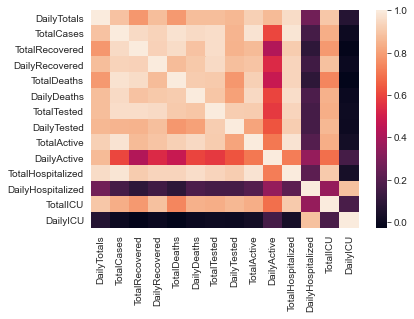

In [193]:
sns.heatmap(province_daily.drop(['OBJECTID'],axis=1).corr())
# sns.heatmap(province_daily[['TotalDeaths','TotalICU','TotalHospitalized','TotalCases']].corr())
province_daily.columns

In [194]:
# province_daily.info()

Clean data: 
- Remove columns
- Convert Province values to title format
- Rename SummaryDate to "date"
- Convert "date" column to datetime format

In [195]:
province_daily.drop('OBJECTID',axis=1,inplace=True)
province_daily['Province'] = province_daily['Province'].apply(lambda x: x.title()) 
province_daily.rename(columns={'SummaryDate':'Date'},inplace=True)

province_daily['Date'] = province_daily['Date'].apply(lambda x: x[:10])
province_daily['Date'] = province_daily['Date'].apply(lambda x: datetime.strptime(x, '%Y/%m/%d'))

Check for unique values, replace values where appropriate 

In [196]:
province_daily['Province'].unique()

array(['Alberta', 'Nwt', 'Yukon', 'Saskatchewan', 'Pei', 'Ontario',
       'New Brunswick', 'Repatriated', 'Nova Scotia', 'Nl', 'Manitoba',
       'Bc', 'Nunavut', 'Quebec', 'Prince Edward Island',
       'Newfoundland And Labrador', 'British Columbia',
       'Northwest Territories', 'Repatriated Cdn', 'Canada'], dtype=object)

In [197]:
province_daily.loc[province_daily['Province'] == 'Nwt', 'Province'] = 'Northwest Territories'
province_daily.loc[province_daily['Province'] == 'Pei', 'Province'] = 'Prince Edward Island'
province_daily.loc[province_daily['Province'] == 'Bc', 'Province'] = 'British Columbia'
province_daily.loc[province_daily['Province'] == 'Nl', 'Province'] = 'Newfoundland And Labrador'
province_daily.loc[province_daily['Province'] == 'Repatriated Cdn', 'Province'] = 'Repatriated'

In [198]:
province_daily.head()

,Date,Province,Abbreviation,DailyTotals,TotalCases,TotalRecovered,DailyRecovered,TotalDeaths,DailyDeaths,TotalTested,DailyTested,TotalActive,DailyActive,TotalHospitalized,DailyHospitalized,TotalICU,DailyICU
0,2020-01-25,Alberta,AB,0,0,0,0,0,0,0,0,0,0.0,NaN,NaN,NaN,NaN
1,2020-01-25,Northwest Territories,NT,0,0,0,0,0,0,0,0,0,0.0,NaN,NaN,NaN,NaN
2,2020-01-25,Yukon,YT,0,0,0,0,0,0,0,0,0,0.0,NaN,NaN,NaN,NaN
3,2020-01-25,Saskatchewan,SK,0,0,0,0,0,0,0,0,0,0.0,NaN,NaN,NaN,NaN
4,2020-01-25,Prince Edward Island,PE,0,0,0,0,0,0,0,0,0,0.0,NaN,NaN,NaN,NaN


#### Overview of cases in Canada

In [199]:
total_cases_in_canada = province_daily['TotalCases'].iloc[1589]
total_deaths_in_canada = province_daily['TotalDeaths'].iloc[1589]
total_recovered_in_canada = province_daily['TotalRecovered'].iloc[1589]

print('Total confirmed cases in Canada as of May 9th, 2020:',total_cases_in_canada)
print('Total deaths in Canada as of May 9th, 2020:',total_deaths_in_canada)
print('Total recovered in Canada as of May 9th, 2020:',total_recovered_in_canada)

Total confirmed cases in Canada as of May 9th, 2020: 67702
Total deaths in Canada as of May 9th, 2020: 4693
Total recovered in Canada as of May 9th, 2020: 31262


#### Plot Canadian daily cases, deaths, and recoveries

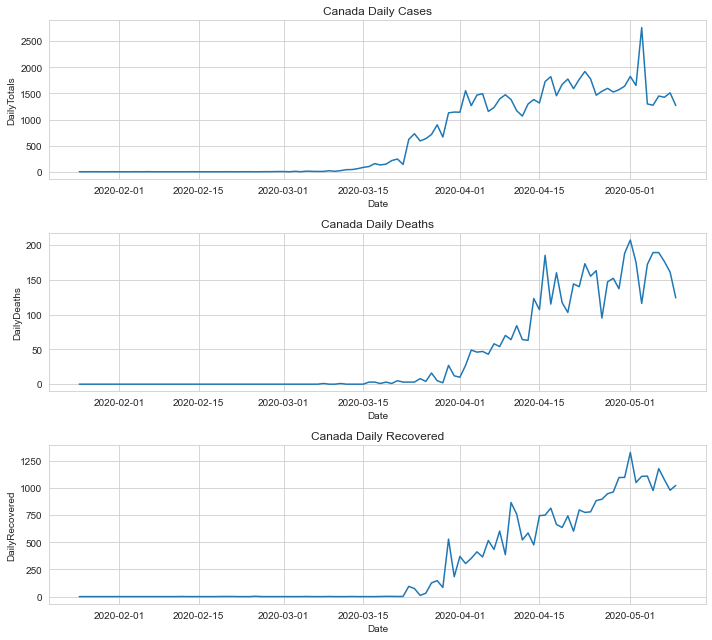

In [200]:
sns.set_style("whitegrid")

fig, axs = plt.subplots(nrows=3,ncols=1,figsize=(10,9))
sns.lineplot(data=province_daily[province_daily['Province'] == 'Canada'], x="Date", y="DailyTotals",ax=axs[0]).set_title('Canada Daily Cases')
sns.lineplot(data=province_daily[province_daily['Province'] == 'Canada'], x="Date", y="DailyDeaths",ax=axs[1]).set_title('Canada Daily Deaths')
sns.lineplot(data=province_daily[province_daily['Province'] == 'Canada'], x="Date", y="DailyRecovered",ax=axs[2]).set_title('Canada Daily Recovered')
plt.tight_layout()

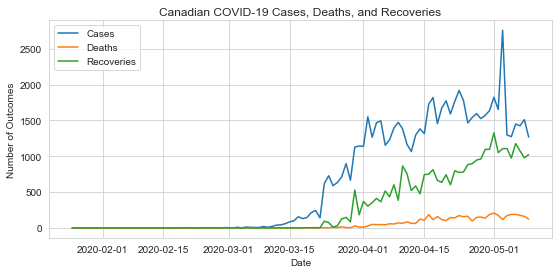

In [201]:
sns.set_style("whitegrid")

# fig, ax = plt.subplots(figsize=(10, 5))
fig, ax = plt.subplots(figsize=(9, 4))

sns.lineplot(data=province_daily[province_daily['Province'] == 'Canada'], x="Date", y="DailyTotals", label='Cases')
sns.lineplot(data=province_daily[province_daily['Province'] == 'Canada'], x="Date", y="DailyDeaths", label='Deaths')
sns.lineplot(data=province_daily[province_daily['Province'] == 'Canada'], x="Date", y="DailyRecovered", label='Recoveries')

ax.legend(ncol=1)
ax.set( ylabel="Number of Outcomes",xlabel="Date")
plt.title('Canadian COVID-19 Cases, Deaths, and Recoveries')
# plt.savefig('../Covid-19 Graphs/1_can_summary.png')

## Provincial Rates

In [27]:
province_daily = province_daily[province_daily['Province']!='Canada']

In [28]:
# total cases per province (interactive)

traces=[]

for x, geo_region in province_daily.groupby('Province'):

    traces.append(go.Scatter(x=geo_region.Date, y=geo_region.TotalCases, name=x, mode='lines'))

fig = go.Figure(data=traces)
fig.update_layout(title='Total Cases by Province',
                   xaxis_title='Date',
                   yaxis_title='Cases',
                  plot_bgcolor='white')
fig.update_xaxes(showline=True, linecolor='LightGrey',showgrid=True, gridwidth=1, gridcolor='LightGrey')
fig.update_yaxes(showline=True, linecolor='LightGrey',showgrid=True, gridwidth=1, gridcolor='LightGrey')

iplot(fig)
# fig.write_image("../Covid-19 Graphs/can_summary.png")

In [29]:
# total deaths per province (interactive)

traces=[]

for x, geo_region in province_daily.groupby('Province'):

    traces.append(go.Scatter(x=geo_region.Date, y=geo_region.TotalDeaths, name=x, mode='lines'))

fig = go.Figure(data=traces)
fig.update_layout(title='Total Deaths by Province',
                   xaxis_title='Date',
                   yaxis_title='Deaths',
                 plot_bgcolor='white')
fig.update_xaxes(showline=True, linecolor='LightGrey',showgrid=True, gridwidth=1, gridcolor='LightGrey')
fig.update_yaxes(showline=True, linecolor='LightGrey',showgrid=True, gridwidth=1, gridcolor='LightGrey')


iplot(fig)
# fig.write_image("../Covid-19 Graphs/fig1.png")

In [30]:
# total recoveries by province (interactive)

traces=[]

for x, geo_region in province_daily.groupby('Province'):

    traces.append(go.Scatter(x=geo_region.Date, y=geo_region.TotalRecovered, name=x, mode='lines'))

fig = go.Figure(data=traces)
fig.update_layout(title='Total Recoveries by Province',
                   xaxis_title='Date',
                   yaxis_title='Recoveries',
                 plot_bgcolor='white')
fig.update_xaxes(showline=True, linecolor='LightGrey',showgrid=True, gridwidth=1, gridcolor='LightGrey')
fig.update_yaxes(showline=True, linecolor='LightGrey',showgrid=True, gridwidth=1, gridcolor='LightGrey')


iplot(fig)

#### Deaths per case

Observing the graph below, it is interesting to note that BC remains way above Alberta in terms of death rate per confirmed case, despite having 4000 fewer confirmed cases. This could be attributed to the amount of testing per province.

- Quebec's graph follows the shape of BC's, just 10 days behind. However, when BC's curve began to flatten out on April 13th, about 5 weeks after their outbreak had started, Quebec's curve was still growing (looks like it might be flattening out now)



In [31]:
province_daily['DeathsPerCase'] = province_daily['TotalDeaths'].div(province_daily['TotalCases'])
# shouldn't have any cases where total deaths is divided by 0 as there must be a confirmed case in order to have a covid-19-related death

In [32]:
# total deaths per case (interactive)

traces=[]

for x, geo_region in province_daily.groupby('Province'):

    traces.append(go.Scatter(x=geo_region.Date, y=geo_region.DeathsPerCase, name=x, mode='lines'))

fig = go.Figure(data=traces)
fig.update_layout(title='Total Deaths per Case',
                   xaxis_title='Date',
                   yaxis_title='Deaths per Case',
                 plot_bgcolor='white')
fig.update_xaxes(showline=True, linecolor='LightGrey',showgrid=True, gridwidth=1, gridcolor='LightGrey')
fig.update_yaxes(showline=True, linecolor='LightGrey',showgrid=True, gridwidth=1, gridcolor='LightGrey')

iplot(fig)

#### Province testing rates

In [33]:
province_tested = pd.read_csv('https://raw.githubusercontent.com/ishaberry/Covid19Canada/master/testing_cumulative.csv')
province_tested.head()

,date_testing,province,cumulative_testing,testing_info
0,19-05-2020,Alberta,218964.0,NaN
1,18-05-2020,Alberta,216536.0,NaN
2,17-05-2020,Alberta,213078.0,NaN
3,16-05-2020,Alberta,209317.0,NaN
4,15-05-2020,Alberta,204723.0,NaN


In [34]:
province_tested.rename(columns={'province':'Province','date_testing':'Date','cumulative_testing':'TotalTesting'},inplace=True)

province_tested['Date'] = province_tested['Date'].apply(lambda x: datetime.strptime(x, '%d-%m-%Y'))

# standardize province values
province_tested.loc[province_tested['Province'] == 'NWT', 'Province'] = 'Northwest Territories'
province_tested.loc[province_tested['Province'] == 'PEI', 'Province'] = 'Prince Edward Island'
province_tested.loc[province_tested['Province'] == 'BC', 'Province'] = 'British Columbia'
province_tested.loc[province_tested['Province'] == 'NL', 'Province'] = 'Newfoundland And Labrador'

In [35]:
# Rows sorted most to least recent, switch this
province_tested.sort_values('Date',ascending=True,inplace=True)
province_tested.tail()

,Date,Province,TotalTesting,testing_info
396,2020-05-19,Ontario,559794.0,NaN
726,2020-05-19,Nunavut,948.0,NaN
330,2020-05-19,Nova Scotia,37482.0,NaN
792,2020-05-19,Yukon,1134.0,NaN
0,2020-05-19,Alberta,218964.0,NaN


In [36]:
# total tests per date

traces=[]

for x, geo_region in province_tested.groupby('Province'):

    traces.append(go.Scatter(x=geo_region.Date, y=geo_region.TotalTesting, name=x, mode='lines'))

fig = go.Figure(data=traces)
fig.update_layout(title='Total Tests by Province',
                   xaxis_title='Date',
                   yaxis_title='Tests',
                 plot_bgcolor='white')
fig.update_xaxes(showline=True, linecolor='LightGrey',showgrid=True, gridwidth=1, gridcolor='LightGrey')
fig.update_yaxes(showline=True, linecolor='LightGrey',showgrid=True, gridwidth=1, gridcolor='LightGrey')

iplot(fig)

#### Tests per population
As we can see in the graph below, 

- The higher the number of tests, the more accurate the deaths/cases ratio is as we can be more certain that the number of cases is accurate as most positive cases should have be identified with more testing. Therefore if the deaths/cases is relatively high in comparison to other provinces but the tests/population rate is relatively low, the deaths/cases is likely lower in real life 
- We would need the entire population tested and all cases confirmed to get a deaths/cases ratio
- BC was testing at a relatively high rate until the start of April, when the total confirmed cases started to flatten and other provinces' testing rates with respect to population increased

In [37]:
province_population = pd.DataFrame({'Province': ['Alberta', 'Northwest Territories', 'Yukon', 'Saskatchewan', 'Prince Edward Island', 'Ontario', 'New Brunswick', 'Nova Scotia', 'Newfoundland And Labrador', 'Manitoba', 'British Columbia', 'Nunavut', 'Quebec'],
                       'Population': [4413146, 44904, 41078, 1181666, 158158, 14711827, 779993, 977457, 521365, 1377517, 5110917, 39097, 8537674]})

In [38]:
province_population.set_index('Province',inplace=True)
province_tested.set_index('Province',inplace=True)

In [39]:
province_tested_pop = province_population.join(province_tested,on='Province')

In [40]:
province_tested_pop.reset_index(inplace=True)
province_tested.reset_index(inplace=True)

In [41]:
province_tested_pop.head()

,Province,Population,Date,TotalTesting,testing_info
0,Alberta,4413146,2020-03-15,7108.0,NaN
1,Alberta,4413146,2020-03-16,10598.0,NaN
2,Alberta,4413146,2020-03-17,12355.0,NaN
3,Alberta,4413146,2020-03-18,14566.0,NaN
4,Alberta,4413146,2020-03-19,17013.0,NaN


In [42]:
province_tested_pop['TestsPerPopulation'] = province_tested_pop['TotalTesting'].div(province_tested_pop['Population'])

In [43]:
# Testing with respect to population
traces=[]

for x, geo_region in province_tested_pop.groupby('Province'):

    traces.append(go.Scatter(x=geo_region.Date, y=geo_region.TestsPerPopulation, name=x, mode='lines'))

fig = go.Figure(data=traces)
fig.update_layout(title='Total Tests by Province Population',
                   xaxis_title='Date',
                   yaxis_title='Tests per Population',
                 plot_bgcolor='white')
fig.update_xaxes(showline=True, linecolor='LightGrey',showgrid=True, gridwidth=1, gridcolor='LightGrey')
fig.update_yaxes(showline=True, linecolor='LightGrey',showgrid=True, gridwidth=1, gridcolor='LightGrey')

iplot(fig)

## Compare Rates by Population
Create a new table to hold the provincial data and additional columns containing population and calculated total cases, deaths, and recoveries divided by each province's respective population. Repatriated cases and Canada as a whole are not included in the following graphs. 

This will give us a better comparison of how Canadian provinces have really been affected with respect to each other. As we can see below, smaller provinces such as Nova Scotia can be seen to have a relatively high infection rate with respect to population, so we can infer that COVID-19 is affecting the smaller parts of canada.

In [44]:
province_population = {'Alberta': 4413146, 'Northwest Territories':44904, 'Yukon':41078, 'Saskatchewan':1181666,
                                    'Prince Edward Island':158158, 'Ontario':14711827, 'New Brunswick':779993, 'Repatriated':float('inf'),
                                    'Nova Scotia': 977457, 'Newfoundland And Labrador':521365, 'Manitoba':1377517,
                                    'British Columbia':5110917, 'Nunavut':39097, 'Quebec':8537674, 'Canada':37894799}
# province_population.values()

In [45]:
province_population = pd.DataFrame({'Province': ['Alberta', 'Northwest Territories', 'Yukon', 'Saskatchewan', 'Prince Edward Island', 'Ontario', 'New Brunswick', 'Repatriated', 'Nova Scotia', 'Newfoundland And Labrador', 'Manitoba', 'British Columbia', 'Nunavut', 'Quebec', 'Canada'],
                       'Population': [4413146, 44904, 41078, 1181666, 158158, 14711827, 779993, None, 977457, 521365, 1377517, 5110917, 39097, 8537674, 37894799]})

In [46]:
province_population.set_index('Province',inplace=True)
province_daily.set_index('Province',inplace=True)

In [47]:
province_daily_pop = province_population.join(province_daily,on='Province')

In [48]:
province_daily_pop.reset_index(inplace=True)
province_daily.reset_index(inplace=True)

In [49]:
# total cases, deaths, recovered, divided by provincial population

province_daily_pop['TotalCasesPerPop'] = province_daily_pop['TotalCases'].div(province_daily_pop['Population'])
province_daily_pop['TotalDeathsPerPop'] = province_daily_pop['TotalDeaths'].div(province_daily_pop['Population'])
province_daily_pop['TotalRecoveredPerPop'] = province_daily_pop['TotalRecovered'].div(province_daily_pop['Population'])

In [50]:
province_daily_pop['ICUPerPop'] = province_daily_pop['TotalICU'].div(province_daily_pop['Population'])

In [51]:
province_daily_pop.set_index('Province',inplace=True)
province_daily_pop.drop(['Canada','Repatriated'],inplace=True)
province_daily_pop.reset_index(inplace=True)
province_daily_pop.head()

,Province,Population,Date,Abbreviation,DailyTotals,TotalCases,TotalRecovered,DailyRecovered,TotalDeaths,DailyDeaths,...,DailyActive,TotalHospitalized,DailyHospitalized,TotalICU,DailyICU,DeathsPerCase,TotalCasesPerPop,TotalDeathsPerPop,TotalRecoveredPerPop,ICUPerPop
0,Alberta,4413146.0,2020-01-25,AB,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,NaN
1,Alberta,4413146.0,2020-01-26,AB,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,NaN
2,Alberta,4413146.0,2020-01-27,AB,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,NaN
3,Alberta,4413146.0,2020-01-28,AB,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,NaN
4,Alberta,4413146.0,2020-01-29,AB,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,NaN


In [52]:
# # Total recovered by population

# sns.set(style="whitegrid")
# plt.figure(figsize=(13,8))
# # sns.palplot(sns.color_palette("BuGn_r"))
# sns.lineplot(x="Date", y="TotalCasesPerPop",
#              hue="Province", 
#              data=province_daily_pop)

In [53]:
# total cases by population (interactive)

traces=[]

for x, geo_region in province_daily_pop.groupby('Province'):

    traces.append(go.Scatter(x=geo_region.Date, y=geo_region.TotalCasesPerPop, name=x, mode='lines'))

fig = go.Figure(data=traces)
fig.update_layout(title='Total Cases by Province Population',
                   xaxis_title='Date',
                   yaxis_title='Cases per Population',
                 plot_bgcolor='white')
fig.update_xaxes(showline=True, linecolor='LightGrey',showgrid=True, gridwidth=1, gridcolor='LightGrey')
fig.update_yaxes(showline=True, linecolor='LightGrey',showgrid=True, gridwidth=1, gridcolor='LightGrey')

iplot(fig)

In [54]:
# ICU Cases/population

traces=[]

for x, geo_region in province_daily_pop.dropna(subset=['TotalICU']).groupby('Province'):

    traces.append(go.Scatter(x=geo_region.Date, y=geo_region.ICUPerPop, name=x, mode='lines'))

fig = go.Figure(data=traces)
fig.update_layout(title='ICU Cases per Population',
                   xaxis_title='Date',
                   yaxis_title='ICU per Population',
                 plot_bgcolor='white')
fig.update_xaxes(showline=True, linecolor='LightGrey',showgrid=True, gridwidth=1, gridcolor='LightGrey')
fig.update_yaxes(showline=True, linecolor='LightGrey',showgrid=True, gridwidth=1, gridcolor='LightGrey')

iplot(fig)

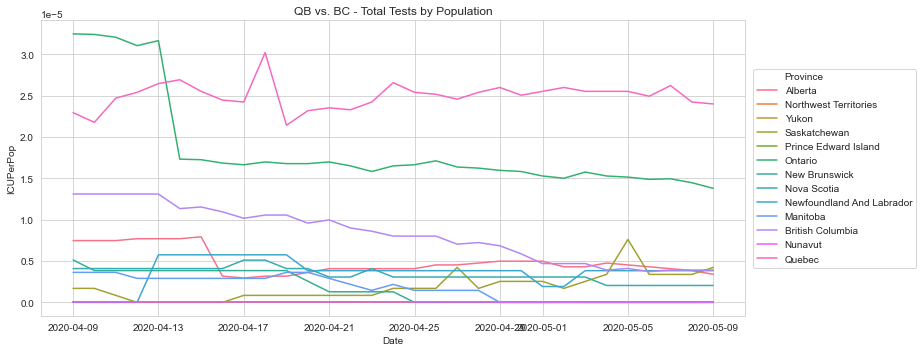

In [213]:
# use graph above instead
sns.set_style("whitegrid")
fig, axs = plt.subplots(figsize=(13,5))
sns.lineplot(x='Date', y='ICUPerPop', data=province_daily_pop.dropna(subset=['TotalICU']),hue='Province').set_title('QB vs. BC - Total Tests by Population')
plt.legend(loc='right', bbox_to_anchor=(1.25, 0.5))
plt.tight_layout()

#### Overall status (as of March 9th)

In [56]:
# Grab province numbers from May 9th, 2020
province_totals = province_daily.loc[range(1470,1484)]

In [57]:
# Remove daily totals as they don't make sense in this context
province_totals.drop(['DailyTotals','DailyRecovered','DailyDeaths','DailyTested','DailyActive','DailyHospitalized','DailyICU'],axis=1,inplace=True)

In [58]:
province_totals.fillna(0,inplace=True)
province_totals.head()

,Province,Date,Abbreviation,TotalCases,TotalRecovered,TotalDeaths,TotalTested,TotalActive,TotalHospitalized,TotalICU,DeathsPerCase
1470,Nunavut,2020-05-09,NU,0,0,0,805,0,0.0,0.0,0.000000
1471,Yukon,2020-05-09,YT,11,11,0,1982,0,0.0,0.0,0.000000
1472,Prince Edward Island,2020-05-09,PE,27,27,0,3816,0,0.0,0.0,0.000000
1473,Newfoundland And Labrador,2020-05-09,NL,261,244,3,9700,14,4.0,2.0,0.011494
1474,New Brunswick,2020-05-09,NB,120,118,0,17426,2,0.0,0.0,0.000000


In [167]:
df = province_totals.set_index('Province')
df.drop(['Date','Abbreviation'],axis=1).style.background_gradient(cmap='Greens')

,TotalCases,TotalRecovered,TotalDeaths,TotalTested,TotalActive,TotalHospitalized,TotalICU,DeathsPerCase
Province,,,,,,,,
Nunavut,0,0,0,805,0,0.000000,0.000000,0.000000
Yukon,11,11,0,1982,0,0.000000,0.000000,0.000000
Prince Edward Island,27,27,0,3816,0,0.000000,0.000000,0.000000
Newfoundland And Labrador,261,244,3,9700,14,4.000000,2.000000,0.011494
New Brunswick,120,118,0,17426,2,0.000000,0.000000,0.000000
British Columbia,2330,1659,129,104994,542,73.000000,20.000000,0.055365
Nova Scotia,1011,743,47,34201,221,5.000000,2.000000,0.046489
Saskatchewan,553,340,6,36117,207,15.000000,5.000000,0.010850
Alberta,6157,4204,116,177559,1837,74.000000,15.000000,0.018840


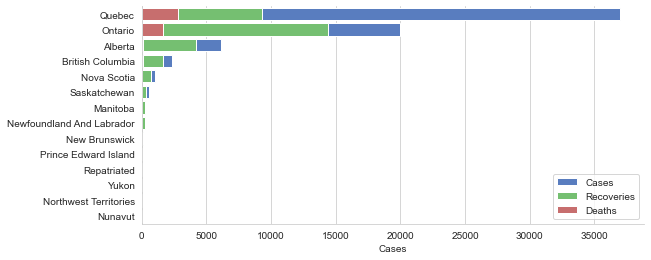

In [206]:
sns.set_style("whitegrid")

fig, ax = plt.subplots(figsize=(9, 4))
df = province_totals[['Province','TotalCases','TotalRecovered','TotalDeaths']]
df.sort_values('TotalCases',ascending=False,inplace=True)

sns.set_color_codes("muted")
sns.barplot(x="TotalCases", y="Province", data=df,label="Cases", color="b")
sns.set_color_codes("muted")
sns.barplot(x="TotalRecovered", y="Province", data=df, label="Recoveries", color="g")
sns.set_color_codes("muted")
sns.barplot(x="TotalDeaths", y="Province", data=df, label="Deaths", color="r")

ax.legend(ncol=1, loc="lower right")
ax.set( ylabel="",xlabel="Cases")
sns.despine(right=True, top=True)

In [61]:
# fig = px.scatter(province_daily_pop, x="TotalICU", y="TotalDeaths", color="Province",
#                  hover_data=['Province'])
# fig.show()

In [62]:
# # sns.set(style="whitegrid")
# plt.figure(figsize=(13,6))
# a = sns.barplot('Province','TotalCases',data=province_totals)
# # province_totals.iplot(kind='bar',x='Province',y='TotalCases')
# a.set_xticklabels()
# # a.set_xticklabels(a.get_xticklabels(), rotation=45,labels='Province')

# plt.tight_layout()
# plt.show()

## Quebec

###### Create heatmap of Quebec COVID-19 cases by health regions

Get GeoJSON from Stats Canada Census

In [63]:
import geopandas as gpd
# from matplotlib import descartes
fp = 'csv_files/Quebec/HR_024a18a_e.shx'
map_df = gpd.read_file(fp)
# check data type so we can see that this is not a normal dataframe, but a GEOdataframe

# map_df.plot()

In [64]:
qb_health_regions = pd.read_csv('csv_files/Quebec/qb_cases_health_region.csv')
qb_health_regions.head()

,Category,Taux pour 100 000
0,Nord-du-Québec,59.005753
1,Gaspésie – Îles-de-la-Madeleine,188.893087
2,Chaudière-Appalaches,95.512759
3,Laval,835.921354
4,Lanaudière,501.065196


In [65]:
# Match category names to health region
categories = ['Bas-Saint-Laurent','Saguenay – Lac-Saint-Jean','Capitale-Nationale','Mauricie et Centre-du-Québec',
     'Estrie','Montréal','Outaouais','Abitibi-Témiscamingue','Côte-Nord','Nord-du-Québec',
     'Gaspésie – Îles-de-la-Madeleine','Chaudière-Appalaches','Laval','Lanaudière','Laurentides',
    'Montérégie','Nunavik','Terres-Cries-de-la-Baie-James']
map_df['Category'] = categories

In [66]:
merged = map_df.set_index('Category').join(qb_health_regions.set_index('Category'))
merged.reset_index(inplace=True)
# merged.head()

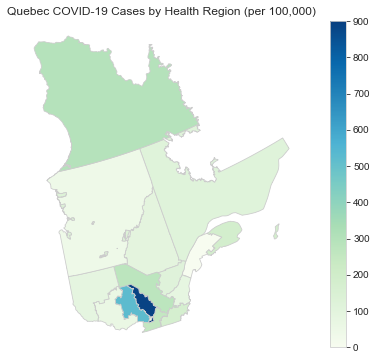

In [67]:
# set the range for the choropleth
vmin, vmax = 120, 220
# create figure and axes for Matplotlib
fig, ax = plt.subplots(1, figsize=(10, 6))


# create map - uses matplotlib, geopandas - specifying column makes it a choropleth map
# merged.plot(column='Taux pour 100 000', cmap='OrRd', ax=ax,linewidth=0.8, edgecolor='0.8')
merged.plot(column='Taux pour 100 000', cmap='GnBu', ax=ax,linewidth=0.8, edgecolor='0.8')
ax.axis('off')

# OrRd GnBu GnBu_r Greens_r

# add a title
ax.set_title('Quebec COVID-19 Cases by Health Region (per 100,000)')

# create an annotation for the data source
# ax.annotate('Source: https://www.inspq.qc.ca/covid-19/donnees',xy=(0.1, .08),  xycoords='figure fraction', horizontalalignment='left', verticalalignment='top', fontsize=12, color='#555555')

# Create colorbar as a legend
sm = plt.cm.ScalarMappable(cmap='GnBu', norm=plt.Normalize(vmin=0, vmax=900))

# empty array for the data range
sm._A = []

# add the colorbar to the figure
cbar = fig.colorbar(sm)

# fig.savefig(“map_export.png”, dpi=300)

Quebec has just under a quarter of Canada's population yet it also has the highest number of coronavirus cases in the country. 

Based on the map above, we can observe that the majority of cases in Quebec come from Montreal, Laval, and Lanaudière. This makes sense as Monreal centre major airport for international travel, with many flights coming from New York, one of the biggest COVID-19 hotspots in the world, and due to Quebec's close proximity to the United States, center to the majority of the world's COVID-19 cases. 

One of the main causes for Quebec's high infection rate was shuttingdown schools and recommending against non-essential travel after the province had went on spring break. The province's spring break took place the first week of March, and as far as most people knew at the time, the coronavirus was mostly affecting Asian countries, and Italy. However, soon after Quebec's spring break had started, several cities in the U.S. declared a state of emergency. Quebec only shutdown schools and recommended against non-essential travel on March 13th, after Quebec students had already been back in classes 4 days earlier after returning from vacation. 

It is likely that Quebec's early spring break was a factor in the province's high infection rate, as other provinces such as British Columbia shutdown schools before their spring break, enduring far fewer cases of coronavirus. 
[https://www.theglobeandmail.com/canada/article-why-quebecs-coronavirus-cases-have-skyrocketed/]

Another reason for the high amount mof cases ay have been retirees who spent their winter in warmer places, such as Florida or Hawaii. After the announcement of the pandemic and many flights getting cancelled, many of these people returned to Canada all at once, aware they needed to self-isolate for 14 days. However, as few of them had any food or supplies remaining at their homes, several people went to local supermarkets to stock up before going into quarantine, causing a sharp rise in cases. 
    [https://www.cbc.ca/news/canada/montreal/snowbirds-scrambling-to-return-to-quebec-1.5502182]
    [https://nationalpost.com/news/local-news/coronavirus-rv-driving-snowbird-expelled-from-two-quebec-grocery-stores/wcm/1d226434-8655-4625-8098-72fa0a6be4d5]

I will also briefly look at British Columbia, as the province had tied for the most cases in Canada with Ontario until March 23rd, and had the most cases with respect to its population from the beginning of February until April 3rd. Since then, the province has had a tremendous decrease in cases, currently sitting at just over 2200 total cases as of May 4th. By comparing the early part of BC's case rate, we can discover what BC has done right to flatten their curve.

## Quebec vs. British Columbia
### Testing

Creating the comparison dataframe: 
- To compare the number of positive cases per number of tests, the total number of cases (TotalCases) is divided by the total number of tests (TotalTested) to see cummulative trends (CasePerTest) and the daily number of cases (DailyTotals) is divided by the daily number of tests (DailyTested) to give a daily trend (CasePerTestDaily). 

- In the early days where some daily testing numbers were 0, which may have been because the number of tests were not being tracked at the beginning of the pandemic - we will drop rows where CasePerTest or CasePerTestDaily are 0, as these values will not accurately represent the the actual positive cases/test, since anything divided by 0 is infinity. These values will not be replaced with the mean value of the respective column as most values of 0 completed daily tests were in the early days of the pandemic, so replacing 0 with a much larger value would skew early results

###### Province-wide testing changes

In the graphs below, there are some obvious spikes in the number of cases per test. These are often due to changes in testing criteria, which usually brings on a significantly higher number of cases that day. 

Quebec changes to screening: https://www.inspq.qc.ca/covid-19/donnees/ligne-du-temps
- March 18th: Increase in screening capacity
- March 22nd: Cases tested positive by hospital laboratories are now considered confirmed.
- April 8th: Staff and all residents of CHSLDs must systematically undergo screening tests for COVID-19. 

Testing context BC:  https://governmentofbc.maps.arcgis.com/home/item.html?id=f7d1318260b14ac2b334e81e55ee5c9e
- As of March 16, testing guidelines changed to focus on hospitalized patients, healthcare workers, long term care facility staff and residents, and those part of a cluster or outbreak who experienced respiratory symptoms. 
- As of April 9, previous testing guidelines were expanded to include individuals with fever (>38°C) and cough or shortness of breath, including (a) residents of remote, isolated or Indigenous communities, (b) people living and working in congregate settings such as work-camps, correctional facilities, shelters, group homes, assisted living and seniors’ residences, (c) people who are homeless or have unstable housing, (d) essential service providers (e.g. first responders), or (e) returning travellers identified at a point of entry to Canada. In addition to these priority groups, health care providers can order a COVID-19 test for any patient based on their clinical judgment. 
- As of Apr 21, universal testing guidelines were implemented to include all symptomatic individuals with fever (>38°C) and cough or shortness of breath.

- April 15th: Change in reported testing definition. [Berry I, Soucy J-PR, Tuite A, Fisman D. Open access epidemiologic data and an interactive dashboard to monitor the COVID-19 outbreak in Canada. CMAJ. 2020 Apr 14;192(15):E420. doi: https://doi.org/10.1503/cmaj.75262]

In addition to luck, BC took the following steps to avoid becoming the next virus epicenter: [https://www.bloomberg.com/news/articles/2020-05-16/a-virus-epicenter-that-wasn-t-how-one-region-stemmed-the-deaths]
- Early communication across the province from higher ups to all doctors and centers regarding COVID-19 symptoms to look out for
- Cancelled elective surgeries early to free up hospital beds in case COVID-19 hospitalizations increased
- One of the first to develop a test for the disease
- Lots of testing done early (started end of January), especially at long-term care facilities
Ontario and Quebec did not  (long term care)
- Long-term care facilities stopped allowing visitors at the first sign of the disease and employees were required to work for one long-term care facility at most
Ontario and Quebec didn’t do the employee thing until later in the crisis

- Recommended against all non-essential travel outside of Canada and shutdown schools right before students left for spring break on March 12th (also had the advantage of having a late spring break) [https://www.cbc.ca/news/canada/british-columbia/bc-ontario-quebec-covid-19-1.5524056 ]
- Shutdown of personal service establishments March 21st [https://globalnews.ca/video/6713347/coronavirus-outbreak-new-order-in-b-c-mandates-shut-down-of-all-personal-service-establishments]

In contrast, Quebec did not take such immediate action with their long-term care facilities until well into their crisis and due to the early timing of their spring break [Bloomberg], they did not not recommend against non-essential travel before many of their residents went on vacation for spring break.  

As mentioned above, we can see that BC was testing much more than Quebec until the end of March. Increasing testing early on likely allowed BC to quickly flatten its curve.

By comparing the tests per population to the number of deaths per case, we can infer that BC is has performed better than Quebec as their test rates are lower and their 

In [127]:
qb_vs_bc_tests = province_tested_pop[province_tested_pop.Province.isin(['Quebec','British Columbia'])]
qb_vs_bc_cases_pop = province_daily_pop[province_daily_pop.Province.isin(['Quebec','British Columbia'])]
qb_vs_bc_death_case = province_daily[province_daily.Province.isin(['Quebec','British Columbia'])]

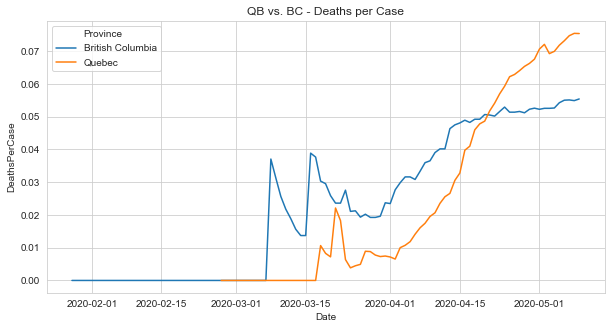

In [131]:
plt.figure(figsize=(9,4))
a = sns.lineplot(x='Date', y='DeathsPerCase', data=qb_vs_bc_death_case,hue='Province').set_title('QB vs. BC - Deaths per Case')
plt.show(a)

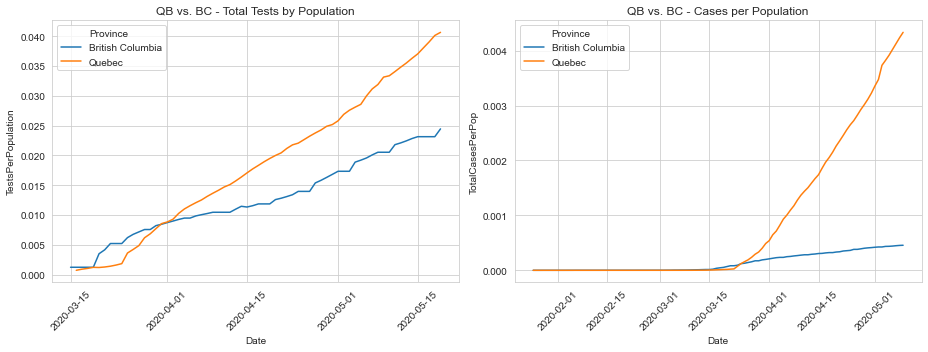

In [168]:
sns.set_style("whitegrid")
fig, axs = plt.subplots(nrows=1,ncols=2,figsize=(13,5))
sns.lineplot(x='Date', y='TestsPerPopulation', data=qb_vs_bc_tests,ax=axs[0],hue='Province').set_title('QB vs. BC - Total Tests by Population')
sns.lineplot(x='Date', y='TotalCasesPerPop', data=qb_vs_bc_cases_pop,ax=axs[1],hue='Province').set_title('QB vs. BC - Cases per Population')
# sns.lineplot(x='Date', y='DeathsPerCase', data=qb_vs_bc_death_case,ax=axs[2],hue='Province').set_title('QB vs. BC - Deaths per Case')

for ax in axs.flatten():
    for label in ax.get_xticklabels():
        label.set_rotation(45)

plt.tight_layout()
# plt.savefig('../Covid-19 Graphs/test')

###### Positive cases per test
Looking at the ratio of positive cases per test, we can see the effects of a province's testing. As BC has a ratio close to 0 for the total positive cases per test, we can infer that the province is performing a testing with few tests coming back positive, but we don't know how much testing is being done solely based on the ratio of cases per test. However as we know from plotting the total number of tests per population, BC is not testing nearly as much as Quebec and therefore we know that the number of cases must be low as we are not testing that many people. 

In [69]:
bc_daily = province_daily[province_daily['Province']=='British Columbia']
bc_daily['CasePerTest'] = bc_daily['TotalCases'].div(bc_daily['TotalTested'])
bc_daily['CasePerTestDaily'] = bc_daily['DailyTotals'].div(bc_daily['DailyTested'])

quebec_daily = province_daily[province_daily['Province']=='Quebec']
quebec_daily['CasePerTest'] = quebec_daily['TotalCases'].div(quebec_daily['TotalTested'])
quebec_daily['CasePerTestDaily'] = quebec_daily['DailyTotals'].div(quebec_daily['DailyTested'])

bc_daily['CasePerTest'].replace([np.inf, -np.inf], np.nan,inplace=True)
quebec_daily['CasePerTest'].replace([np.inf, -np.inf], np.nan,inplace=True)
bc_daily['CasePerTestDaily'].replace([np.inf, -np.inf], np.nan,inplace=True)
quebec_daily['CasePerTestDaily'].replace([np.inf, -np.inf], np.nan,inplace=True)

bc_daily.dropna(subset=['CasePerTest','CasePerTestDaily'],inplace=True)
quebec_daily.dropna(subset=['CasePerTest','CasePerTestDaily'],inplace=True)

In [70]:
# bc_daily['CasePerTest'].fillna(bc_daily['TotalTested'].mean(),inplace=True)
# bc_daily['CasePerTestDaily'].fillna(bc_daily['DailyTested'].mean(),inplace=True)
# quebec_daily['CasePerTest'].fillna(quebec_daily['TotalTested'].mean(),inplace=True)
# quebec_daily['CasePerTestDaily'].fillna(quebec_daily['DailyTested'].mean(),inplace=True)

In [71]:
compare = bc_daily.append(quebec_daily)
compare.head()

,Province,Date,Abbreviation,DailyTotals,TotalCases,TotalRecovered,DailyRecovered,TotalDeaths,DailyDeaths,TotalTested,DailyTested,TotalActive,DailyActive,TotalHospitalized,DailyHospitalized,TotalICU,DailyICU,DeathsPerCase,CasePerTest,CasePerTestDaily
711,British Columbia,2020-03-15,BC,0,73,5,0,1,0,6326,6326,67,0.0,NaN,NaN,NaN,NaN,0.013699,0.011540,0.000000
780,British Columbia,2020-03-20,BC,77,348,6,1,9,1,17912,11586,333,75.0,NaN,NaN,NaN,NaN,0.025862,0.019428,0.006646
795,British Columbia,2020-03-21,BC,76,424,6,0,10,1,21296,3384,408,75.0,NaN,NaN,NaN,NaN,0.023585,0.019910,0.022459
808,British Columbia,2020-03-22,BC,0,424,6,0,10,0,26681,5385,408,0.0,NaN,NaN,NaN,NaN,0.023585,0.015891,0.000000
851,British Columbia,2020-03-25,BC,42,659,183,10,14,1,31739,5058,462,31.0,NaN,NaN,NaN,NaN,0.021244,0.020763,0.008304


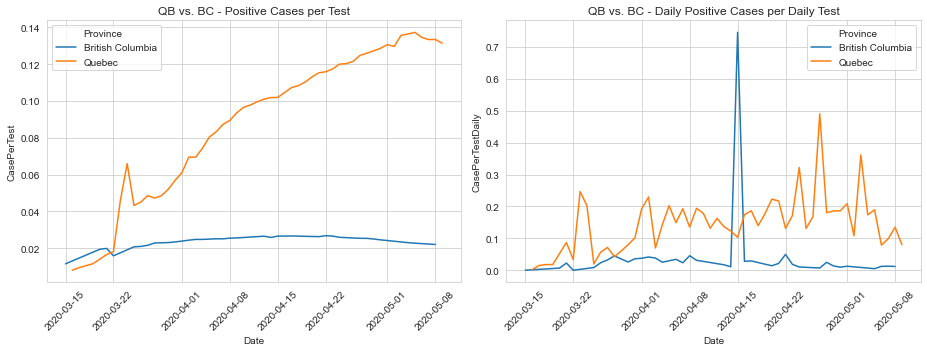

In [161]:
sns.set_style("whitegrid")

# row format
# fig, axs = plt.subplots(nrows=2,ncols=1,figsize=(10,7))
# sns.lineplot(x='Date', y='CasePerTest', data=compare,ax=axs[0],hue='Province').set_title('QB vs. BC - Positive Cases per Test')
# sns.lineplot(x='Date', y='CasePerTestDaily', data=compare,ax=axs[1],hue='Province').set_title('QB vs. BC - Daily Positive Cases per Daily Test')

# column format
fig, axs = plt.subplots(nrows=1,ncols=2,figsize=(13,5))
sns.lineplot(x='Date', y='CasePerTest', data=compare,ax=axs[0],hue='Province').set_title('QB vs. BC - Positive Cases per Test')
# plt.xticks(rotation=45, horizontalalignment='right')

sns.lineplot(x='Date', y='CasePerTestDaily', data=compare,ax=axs[1],hue='Province').set_title('QB vs. BC - Daily Positive Cases per Daily Test')
# plt.xticks(rotation=45, horizontalalignment='right')

for ax in axs.flatten():
    for label in ax.get_xticklabels():
        label.set_rotation(45)

plt.tight_layout()
# plt.savefig('../Covid-19 Graphs/test22')

In [73]:
# qb_vs_bc_tests = province_tested_pop[province_tested_pop.Province.isin(['Quebec','British Columbia'])]
# plt.figure(figsize=(12,4))
# sns.lineplot(x='Date', y='TestsPerPopulation', data=qb_vs_bc_tests,hue='Province').set_title('QB vs. BC - Total Tests by Population')

In [74]:
# qb_vs_bc_cases_pop = province_daily_pop[province_daily_pop.Province.isin(['Quebec','British Columbia'])]
# plt.figure(figsize=(12,4))
# sns.lineplot(x='Date', y='TotalCasesPerPop', data=qb_vs_bc_cases_pop,hue='Province').set_title('QB vs. BC - Cases per Population')

In [75]:
# #  Deaths per case

# qb_vs_bc_death_case = province_daily[province_daily.Province.isin(['Quebec','British Columbia'])]
# plt.figure(figsize=(12,4))
# sns.lineplot(x='Date', y='DeathsPerCase', data=qb_vs_bc_death_case,hue='Province').set_title('QB vs. BC - Deaths per Case')

### Attempting to measure severity using unbiased data. 
While daily testing and positive case numbers can be somewhat inaccurate due to limited testing supplies leading to fewer tests given during the months of March and early April and trouble in data collection due to a sudden intake in hospitalizations and testing demand, daily deaths, hospitalizations, and ICU numbers are less subjected to bias.

In addition, changing testing criteria and protocols lead to sudden increases in cases on the days of the updates.

It is important to note that the total and daily number of ICU patients and hospitalized patients are missing from all provinces from the Provincial_Daily_Totals.csv file until April 8th, 2020. This largely affects BC's numbers in particular as BC was a main center for the COVID-19 breakout in Canada from mid-March until the beginning of April and we therefore miss the severity of BC's ICU and Hospitalized cases at its peak. Without daily data leading up to April 8th, all of the ICU cases were provided at once as a daily increase on April 8th. I was unable to find any datasets with ICU or hospitalization numbers for BC prior to April 8th. The numbers for Quebec are from a different dataset from the government of Quebec that contains cumulative ICU and hospitalization numbers from before April 8th, 2020.

In [76]:
bc_severity = province_daily[province_daily['Province'] == 'British Columbia']

In [77]:
bc_severity['TotalHospitalized'].replace([np.nan], 0,inplace=True)
bc_severity['TotalICU'].replace([np.nan], 0,inplace=True)
bc_severity['Severity'] = bc_severity['TotalHospitalized'] + bc_severity['TotalICU'] + bc_severity['TotalDeaths']
bc_severity['ICUPerDeath'] = bc_severity['TotalICU'].div(bc_severity['TotalDeaths'])
bc_severity.head()

,Province,Date,Abbreviation,DailyTotals,TotalCases,TotalRecovered,DailyRecovered,TotalDeaths,DailyDeaths,TotalTested,DailyTested,TotalActive,DailyActive,TotalHospitalized,DailyHospitalized,TotalICU,DailyICU,DeathsPerCase,Severity,ICUPerDeath
11,British Columbia,2020-01-25,BC,0,0,0,0,0,0,0,0,0,0.0,0.0,NaN,0.0,NaN,NaN,0.0,NaN
21,British Columbia,2020-01-26,BC,0,0,0,0,0,0,0,0,0,0.0,0.0,NaN,0.0,NaN,NaN,0.0,NaN
38,British Columbia,2020-01-27,BC,0,0,0,0,0,0,0,0,0,0.0,0.0,NaN,0.0,NaN,NaN,0.0,NaN
52,British Columbia,2020-01-28,BC,1,1,0,0,0,0,0,0,1,1.0,0.0,NaN,0.0,NaN,0.0,0.0,NaN
67,British Columbia,2020-01-29,BC,0,1,0,0,0,0,0,0,1,0.0,0.0,NaN,0.0,NaN,0.0,0.0,NaN


In [78]:
# qb_severity = Hospitalizations, ICU numbers, Deaths with respect to date
qb_severity = pd.read_excel('csv_files/Quebec/qb_cleaned.xlsx')
qb_severity.rename(columns={'Hospitalisations':'TotalHospitalized','DateTime':'Date','Soins intensifs':'TotalICU',
                            'Nombre cumulatif de décès':'TotalDeaths','Nouveaux décès':'DailyDeaths'},inplace=True)

In [79]:
qb_severity_no_hosp = qb_severity.copy()
qb_severity_no_hosp['Severity'] = qb_severity['TotalICU'] + qb_severity['TotalDeaths']
# qb_severity.head()

In [80]:
qb_severity['Severity'] = qb_severity['TotalHospitalized'] + qb_severity['TotalICU'] + qb_severity['TotalDeaths']
qb_severity['ICUPerDeath'] = qb_severity['TotalICU'].div(qb_severity['TotalDeaths'])

In [81]:
# Can't divide by 0, so set ICUPerDeath values to 0 instead of infinity 
qb_severity['ICUPerDeath'][0] = 0
qb_severity['ICUPerDeath'][1] = 0
qb_severity['ICUPerDeath'][2] = 0
qb_severity.head()

,Date,TotalHospitalized,TotalICU,TotalDeaths,DailyDeaths,Severity,ICUPerDeath
0,2020-03-15,2,0,0,0,2,0.0
1,2020-03-16,5,0,0,0,5,0.0
2,2020-03-17,6,4,0,0,10,0.0
3,2020-03-18,7,4,1,1,12,4.0
4,2020-03-19,10,6,1,0,17,6.0


In [82]:
qb_severity['Province'] = 'Quebec'
# bc_severity['Province'] = 'British Columbia'
qb_severity.columns

Index(['Date', 'TotalHospitalized', 'TotalICU', 'TotalDeaths', 'DailyDeaths',
       'Severity', 'ICUPerDeath', 'Province'],
      dtype='object')

In [83]:
bc_severity.columns

Index(['Province', 'Date', 'Abbreviation', 'DailyTotals', 'TotalCases',
       'TotalRecovered', 'DailyRecovered', 'TotalDeaths', 'DailyDeaths',
       'TotalTested', 'DailyTested', 'TotalActive', 'DailyActive',
       'TotalHospitalized', 'DailyHospitalized', 'TotalICU', 'DailyICU',
       'DeathsPerCase', 'Severity', 'ICUPerDeath'],
      dtype='object')

In [84]:
qb_vs_bc_severity = pd.concat([qb_severity,bc_severity.drop(['Abbreviation', 'DailyTotals', 'TotalCases',
                                             'TotalRecovered', 'DailyRecovered', 'TotalTested', 
                                             'DailyTested', 'TotalActive','DailyActive',
                                             'DailyHospitalized', 'DailyICU','DeathsPerCase'],
                                            axis=1)])

A province that would be considered stable and to have rid their COVID-19 infections would have a graph that descends until the total number of deaths, ICU cases, and hospitalized cases stop increasing, when it will look near constant. As we can see below, BC has essentially reached this point of stability in which the number of ICU and Hospitalized cases have reduced drastically. As Quebec's graph is still increasing, we can infer that the province has not yet been able to control their outbreak and the number of deaths, ICU cases, and hospitalized cases will continue to grow. 

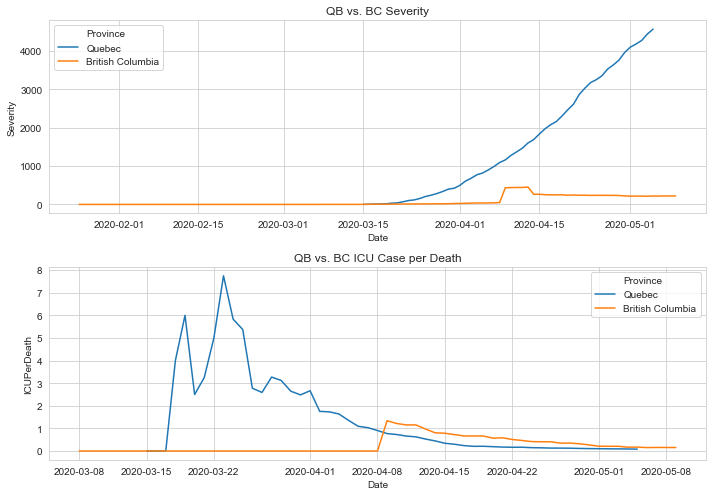

In [85]:
sns.set_style("whitegrid")

fig, axs = plt.subplots(nrows=2,ncols=1,figsize=(10,7))
sns.lineplot(x='Date', y='Severity', data=qb_vs_bc_severity, ax=axs[0], hue='Province').set_title('QB vs. BC Severity')
sns.lineplot(x='Date', y='ICUPerDeath', data=qb_vs_bc_severity, ax=axs[1],hue='Province').set_title('QB vs. BC ICU Case per Death')
plt.tight_layout()

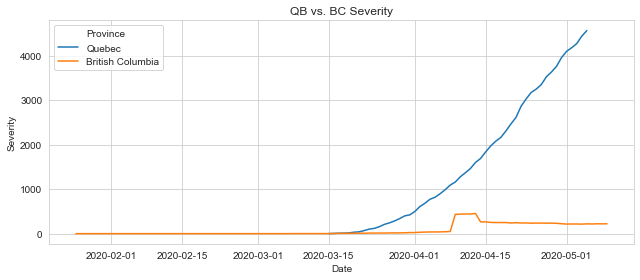

In [174]:
sns.set_style("whitegrid")

fig, axs = plt.subplots(figsize=(9,4))
sns.lineplot(x='Date', y='Severity', data=qb_vs_bc_severity, hue='Province').set_title('QB vs. BC Severity')
plt.tight_layout()

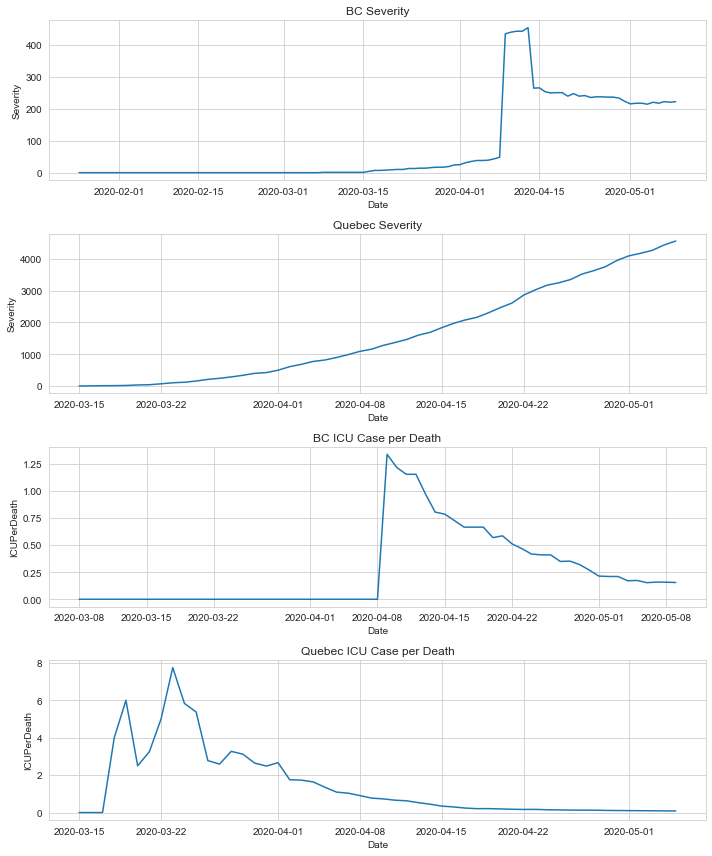

In [87]:
sns.set_style("whitegrid")

fig, axs = plt.subplots(nrows=4,ncols=1,figsize=(10,12))
sns.lineplot(x='Date', y='Severity', data=bc_severity, ax=axs[0]).set_title('BC Severity')
sns.lineplot(x='Date', y='ICUPerDeath', data=bc_severity, ax=axs[2]).set_title('BC ICU Case per Death')
sns.lineplot(x='Date', y='Severity', data=qb_severity, ax=axs[1]).set_title('Quebec Severity')
sns.lineplot(x='Date', y='ICUPerDeath', data=qb_severity, ax=axs[3]).set_title('Quebec ICU Case per Death')
plt.tight_layout()

# Canada vs. International
###### Infection rate

In [88]:
# conf_time.set_index('Date').iplot(xTitle="Date",yTitle="Confirmed Cases", title="Number of Confirmed Covid-19 Cases by Canadian Province/Territory")

In [89]:
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots

In [90]:
fig = go.Figure()
# Create and style traces
fig.add_trace(go.Scatter(x=CAN_daily['Date'], y=CAN_daily['TotalCases'], name='CAN',
                         line=dict(color='firebrick') # ,mode='lines+markers'
                        ))
fig.add_trace(go.Scatter(x=SWE_daily['Date'], y=SWE_daily['TotalCases'], name = 'SWE',
                         line=dict(color='royalblue')))
fig.add_trace(go.Scatter(x=KOR_daily['Date'], y=KOR_daily['TotalCases'], name='KOR',
                         line=dict(color='orange')))
fig.add_trace(go.Scatter(x=GBR_daily['Date'], y=GBR_daily['TotalCases'], name = 'GBR',
                         line=dict(color='green')))
fig.add_trace(go.Scatter(x=ITA_daily['Date'], y=ITA_daily['TotalCases'], name='ITA',
                         line=dict(color='yellow')))

fig.add_trace(go.Scatter(x=USA_daily['Date'], y=USA_daily['TotalCases'], name = 'USA',
                         line=dict(color='blue')))
fig.add_trace(go.Scatter(x=CHN_daily['Date'], y=CHN_daily['TotalCases'], name = 'CHN',
                         line=dict(color='black')))
fig.add_trace(go.Scatter(x=CN_HB_daily['Date'], y=CN_HB_daily['TotalCases'], name = 'CN_HB',
                         line=dict(color='pink')))

# Edit the layout
fig.update_layout(title='Total Confirmed Covid-19 Cases (International)',
                   xaxis_title='Date',
                   yaxis_title='Number of Cases',
                  plot_bgcolor='white')
fig.update_xaxes(showline=True, linecolor='LightGrey',showgrid=True, gridwidth=1, gridcolor='LightGrey')
fig.update_yaxes(showline=True, linecolor='LightGrey',showgrid=True, gridwidth=1, gridcolor='LightGrey')



fig.show()

In [91]:
fig = go.Figure()

fig.add_trace(go.Scatter(x=CAN_daily['Days since 100th case'], y=CAN_daily['TotalCases'], name='CAN',
                         line=dict(color='firebrick') # dash options include 'dash', 'dot', and 'dashdot'
))
fig.add_trace(go.Scatter(x=SWE_daily['Days since 100th case'], y=SWE_daily['TotalCases'], name='SWE',
                         line = dict(color='royalblue')))
fig.add_trace(go.Scatter(x=KOR_daily['Days since 100th case'], y=KOR_daily['TotalCases'], name='KOR',
                         line=dict(color='orange')))
fig.add_trace(go.Scatter(x=GBR_daily['Days since 100th case'], y=GBR_daily['TotalCases'], name = 'GBR',
                         line=dict(color='green')))
fig.add_trace(go.Scatter(x=ITA_daily['Days since 100th case'], y=ITA_daily['TotalCases'], name='ITA',
                         line=dict(color='yellow')))

fig.add_trace(go.Scatter(x=USA_daily['Days since 100th case'], y=USA_daily['TotalCases'], name = 'USA',
                         line=dict(color='purple')))

fig.add_trace(go.Scatter(x=CHN_daily['Days since 100th case'], y=CHN_daily['TotalCases'], name = 'CHN',
                         line=dict(color='black')))
fig.add_trace(go.Scatter(x=CN_HB_daily['Days since 100th case'], y=CN_HB_daily['TotalCases'], name = 'CN_HB',
                         line=dict(color='pink')))

# Edit the layout
fig.update_layout(title='Infection Rate after 100th Case',
                   xaxis_title='Number of days since 100th reported case',
                   yaxis_title='Number of cases - or reported cases per 1M',
                  plot_bgcolor='white')
fig.update_xaxes(showline=True, linecolor='LightGrey',showgrid=True, gridwidth=1, gridcolor='LightGrey')
fig.update_yaxes(showline=True, linecolor='LightGrey',showgrid=True, gridwidth=1, gridcolor='LightGrey')

fig.show()

###### Infection rates per population

In [92]:
population = {'CAN':37742154,'SWE':10099265, 'KOR':51269185,'GBR':67886011,
              'ITA':60461826,'USA':331002651,'CHN':1439323776,'CN_HB':59020000}
population_mill = {'CAN':37.742154,'SWE':10.099265, 'KOR':51.269185,'GBR':67.886011,
              'ITA':60.461826,'USA':331.002651,'CHN':1439.323776,'CN_HB':59.020000}
print('Canadian population:',population['CAN'])

Canadian population: 37742154


In [93]:
def divide_by_population(df,country):
    new_col = df['TotalCases'].apply(lambda x: x/population[country])
    return new_col

By plotting infection rates per population, we can clearly see how well each country has handled their respective COVID-19 outbreaks. As expected, Italy and the U.S. have the highest ratio, however where Italy is flattening, the U.S. mirror's Italy's shape during the month of March, looking like growth will continue for the foreseable future. These countries are followed by the UK and then Sweden. Sweden has been critisized for refusing to impose a strict lockdown, leaving businesses and schools for those under 16 open, enforcing social distanding, and allowing small groups to meet [https://www.cbc.ca/news/world/sweden-pm-lofven-coronavirus-1.5571073]. With their healthcare system able to handle the amount of COVID cases thus far, Sweden seems to have managed their outbreak and saved their economy in the short run, however in the long run, Sweden's economy is likely to be just as affected as other countries who imposed full lockdown [https://www.cnbc.com/2020/04/30/coronavirus-sweden-economy-to-contract-as-severely-as-the-rest-of-europe.html]. Canada isn't doing terribly in relation to other country's infection rate with respect to population, however there is obviously room for improvement as South Korea, China, and Hubei province were able to flatten their curves quickly despite their high populations and limited square footage. 

In [94]:
fig = go.Figure()

# can = divide_by_population(CAN_daily,'CAN')
# swe = divide_by_population(SWE_daily,'SWE')
# can = divide_by_population(CAN_daily,'CAN')
# swe = divide_by_population(SWE_daily,'SWE')

fig.add_trace(go.Scatter(x=CAN_daily['Date'], y=divide_by_population(CAN_daily,'CAN'), 
                         name='CAN', line=dict(color='firebrick') # dash options include 'dash', 'dot', and 'dashdot'
))
fig.add_trace(go.Scatter(x=SWE_daily['Date'], y=divide_by_population(SWE_daily,'SWE'),
                         name='SWE',line = dict(color='royalblue')))
fig.add_trace(go.Scatter(x=KOR_daily['Date'], y=divide_by_population(KOR_daily,'KOR'),
                         name='KOR',
                         line=dict(color='orange')))
fig.add_trace(go.Scatter(x=GBR_daily['Date'], y=divide_by_population(GBR_daily,'GBR'),
                         name = 'GBR',
                         line=dict(color='green')))
fig.add_trace(go.Scatter(x=ITA_daily['Date'], y=divide_by_population(ITA_daily,'ITA'),
                         name='ITA',
                         line=dict(color='yellow')))

fig.add_trace(go.Scatter(x=USA_daily['Date'], y=divide_by_population(USA_daily,'USA'),
                         name = 'USA',
                         line=dict(color='purple')))

fig.add_trace(go.Scatter(x=CHN_daily['Date'], y=divide_by_population(CHN_daily,'CHN'),
                         name = 'CHN',
                         line=dict(color='black')))
fig.add_trace(go.Scatter(x=CN_HB_daily['Date'], y=divide_by_population(CN_HB_daily,'CN_HB'),
                         name = 'CN_HB',
                         line=dict(color='pink')))

# Edit the layout
fig.update_layout(title='Infection Rate per Population',
                   xaxis_title='Date',
                   yaxis_title='Case percentage',
                  plot_bgcolor='white')
fig.update_xaxes(showline=True, linecolor='LightGrey',showgrid=True, gridwidth=1, gridcolor='LightGrey')
fig.update_yaxes(showline=True, linecolor='LightGrey',showgrid=True, gridwidth=1, gridcolor='LightGrey')


fig.show()

In [95]:
# from plotly.subplots import make_subplots

# fig = make_subplots(rows=1, cols=2, shared_yaxes=True)

# fig.add_trace(go.Bar(x=CAN_daily['Date'], y=CAN_daily['TotalCases'],
#                     marker=dict(color=CAN_daily['TotalCases'], coloraxis="coloraxis")),
#               1, 1)

# fig.add_trace(go.Bar(x=SWE_daily['Date'], y=SWE_daily['TotalCases'],
#                     marker=dict(color=SWE_daily['TotalCases'], coloraxis="coloraxis")),
#               1, 2)

# fig.update_layout(coloraxis=dict(colorscale='Bluered_r'))
# fig.show()

In [96]:
fig = px.bar(CAN_daily, x='Date', y='TotalCases', color_continuous_scale='Darkmint',
             hover_data=['TotalCases'], color='TotalCases', title='Confirmed Cases Canada',
             height=400)
fig.show()

fig = px.bar(SWE_daily, x='Date', y='TotalCases', color_continuous_scale='Darkmint',
             hover_data=['TotalCases'], color='TotalCases', title='Confirmed Cases Sweden',
             height=400)
fig.show()

fig = px.bar(KOR_daily, x='Date', y='TotalCases', color_continuous_scale='Darkmint',
             hover_data=['TotalCases'], color='TotalCases', title='Confirmed Cases South Korea',
             height=400)
fig.show()

fig = px.bar(GBR_daily, x='Date', y='TotalCases', color_continuous_scale='Darkmint',
             hover_data=['TotalCases'], color='TotalCases', title='Confirmed Cases UK',
             height=400)
fig.show()

fig = px.bar(ITA_daily, x='Date', y='TotalCases', color_continuous_scale='Darkmint',
             hover_data=['TotalCases'], color='TotalCases', title='Confirmed Cases Italy',
             height=400)
fig.show()

fig = px.bar(USA_daily, x='Date', y='TotalCases', color_continuous_scale='Darkmint',
             hover_data=['TotalCases'], color='TotalCases', title='Confirmed Cases USA',
             height=400)
fig.show()

fig = px.bar(CHN_daily, x='Date', y='TotalCases', color_continuous_scale='Darkmint',
             hover_data=['TotalCases'], color='TotalCases', title='Confirmed Cases China',
             height=400)
fig.show()

fig = px.bar(CN_HB_daily, x='Date', y='TotalCases', color_continuous_scale='Darkmint',
             hover_data=['TotalCases'], color='TotalCases', title='Confirmed Cases Hubei Province',
             height=400)

fig.show()

Based on above plots, we want to be like South Korea and China, who have flattened their curves, creating more of a sigmoid function. While it doesn't look like Canada's graph has flattened, the number of confirmed cases per day have decreased.

In [214]:
fig = make_subplots(rows=3, cols=2, start_cell="bottom-left",
                        specs=[[{}, {}],
                               [{}, {}],
                               [{}, {}] ],
#            [{"colspan": 2}, None]],
                   subplot_titles=("Canada","Sweden"
                                   , "South Korea","UK",
                                  'Italy', 'US'
                                  ))

# fig.add_trace(go.Scatter(x=[1, 2, 3], y=[4, 5, 6]),
#               row=1, col=1)

fig.add_trace(go.Bar(x=CAN_daily['Date'], y=CAN_daily['TotalCases'], name='Canada',
                     marker=dict(color=CAN_daily['TotalCases'], coloraxis="coloraxis")),1, 1 )

fig.add_trace(go.Bar(x=SWE_daily['Date'], y=SWE_daily['TotalCases'], name='Sweden',
                     marker=dict(color=SWE_daily['TotalCases'], coloraxis="coloraxis")),1, 2 )

fig.add_trace(go.Bar(x=KOR_daily['Date'], y=KOR_daily['TotalCases'], name='South Korea',
                     marker=dict(color=KOR_daily['TotalCases'], coloraxis="coloraxis")),2, 1 )

fig.add_trace(go.Bar(x=GBR_daily['Date'], y=GBR_daily['TotalCases'], name='GBR',
                     marker=dict(color=GBR_daily['TotalCases'], coloraxis="coloraxis")),2, 2 )

fig.add_trace(go.Bar(x=ITA_daily['Date'], y=ITA_daily['TotalCases'], name='Italy',
                     marker=dict(color=ITA_daily['TotalCases'], coloraxis="coloraxis")),3, 1 )

fig.add_trace(go.Bar(x=USA_daily['Date'], y=USA_daily['TotalCases'], name='US',
                     marker=dict(color=USA_daily['TotalCases'], coloraxis="coloraxis")),3, 2 )

fig.update_layout(coloraxis=dict(colorscale='Darkmint'),title_text="Comparing COVID-19 Cases between Countries")

fig.update_layout(plot_bgcolor='white',legend_orientation="h",legend_title_text='Country')
fig.update_xaxes(showline=True, linecolor='LightGrey',showgrid=True, gridwidth=1, gridcolor='LightGrey')
fig.update_yaxes(showline=True, linecolor='LightGrey',showgrid=True, gridwidth=1, gridcolor='LightGrey')

fig.show()
plt.tight_layout()

fig.write_html("../Covid-19 Graphs/country_compare_bar.html")

<Figure size 432x288 with 0 Axes>

The shape of Canada's graph above follows a similar shape to the US, the UK, Sweden, and the early parts of Italy and South Korea. It is likely that Canada's numbers will continue to grow in the near future, however considering the infection rate with respect to population, it is unlikely that Canada will become the next U.S. or Italy if the country is re-opened carefully and its population follows social distancing and hand hygiene practices.



# Prophet 
## Global predictions

In [98]:
from fbprophet import Prophet

To pass in dataframe to prophet model, need to rename columns 'ds' (datestamp) and 'y' (numeric values to be predicted)

In [99]:
global_cases = pd.DataFrame(global_nums['Cases'].groupby('Date').sum())
global_deaths = pd.DataFrame(global_nums['Deaths'].groupby('Date').sum())
global_recovered = pd.DataFrame(global_nums['Recovered'].groupby('Date').sum())

global_cases.reset_index(inplace=True)
global_deaths.reset_index(inplace=True)
global_recovered.reset_index(inplace=True)

In [100]:
global_cases.rename(columns={'Date':'ds','Cases':'y'},inplace=True)
global_deaths.rename(columns={'Date':'ds','Deaths':'y'},inplace=True)
global_recovered.rename(columns={'Date':'ds','Recovered':'y'},inplace=True)

##### Modelling Cases

In [101]:
case_model = Prophet(interval_width=0.95)
case_model.fit(global_cases)

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/anaconda3/lib/python3.7/site-packages/fbprophet/forecaster.py:400: FutureWarning:

The pandas.datetime class is deprecated and will be removed from pandas in a future version. Import from datetime module instead.



Specify how many days should be included in forecase

In [102]:
predict_dates = case_model.make_future_dataframe(periods=7)
# predict_dates.tail()

Predict will give us a predicted value, yhat, and includes columns with uncertainty intervals

In [103]:
case_forecast = case_model.predict(predict_dates)
case_forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()

,ds,yhat,yhat_lower,yhat_upper
106,2020-05-07,3.821435e+06,3.798370e+06,3.840441e+06
107,2020-05-08,3.905027e+06,3.872752e+06,3.933536e+06
108,2020-05-09,3.986126e+06,3.942945e+06,4.026076e+06
109,2020-05-10,4.064728e+06,4.006707e+06,4.116150e+06
110,2020-05-11,4.140306e+06,4.071204e+06,4.204448e+06


###### Plot predicted positive cases over the next 7 days

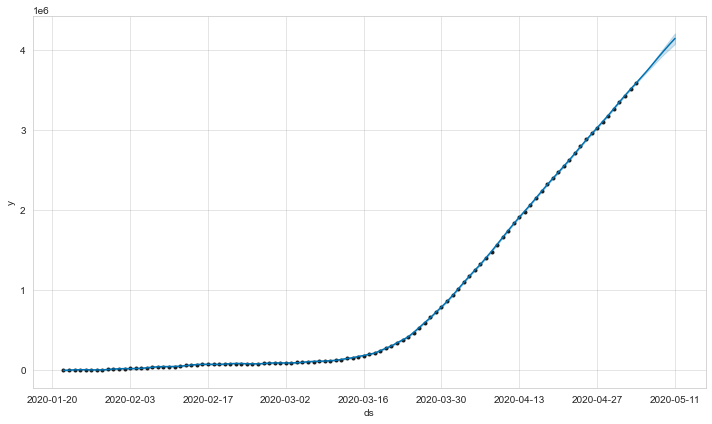

In [104]:
predicted_cases = case_model.plot(case_forecast)

/anaconda3/lib/python3.7/site-packages/fbprophet/forecaster.py:400: FutureWarning:

The pandas.datetime class is deprecated and will be removed from pandas in a future version. Import from datetime module instead.



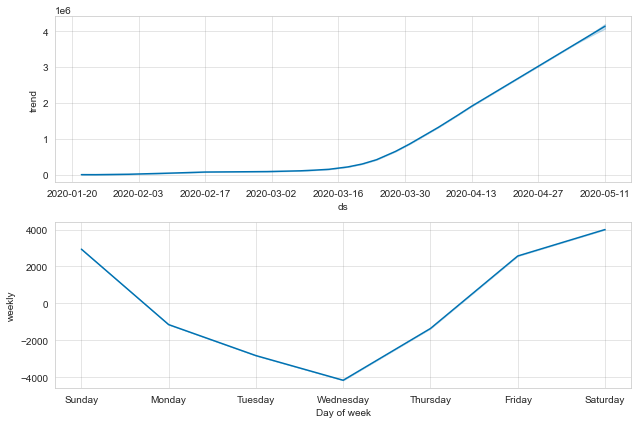

In [105]:
predicted_cases = case_model.plot_components(case_forecast)

In [106]:
from fbprophet.plot import plot_plotly
import plotly.offline as pa
pa.init_notebook_mode()

fig = plot_plotly(case_model, case_forecast)  # This returns a plotly Figure
pa.iplot(fig)

##### Modelling Deaths

In [107]:
deaths_model = Prophet(interval_width=0.95)
deaths_model.fit(global_deaths)

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/anaconda3/lib/python3.7/site-packages/fbprophet/forecaster.py:400: FutureWarning:

The pandas.datetime class is deprecated and will be removed from pandas in a future version. Import from datetime module instead.



In [108]:
predict_dates = deaths_model.make_future_dataframe(periods=7)
# predict_dates.tail()

In [109]:
deaths_forecast = deaths_model.predict(predict_dates)
deaths_forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()

,ds,yhat,yhat_lower,yhat_upper
106,2020-05-07,276114.883359,273341.323837,278863.866176
107,2020-05-08,282450.963450,279175.419719,285458.235252
108,2020-05-09,288485.414409,284453.574634,292155.254614
109,2020-05-10,293900.231332,288987.714937,298815.209744
110,2020-05-11,299550.270468,293613.555537,305171.301472


###### Plot predicted deaths over the next 7 days

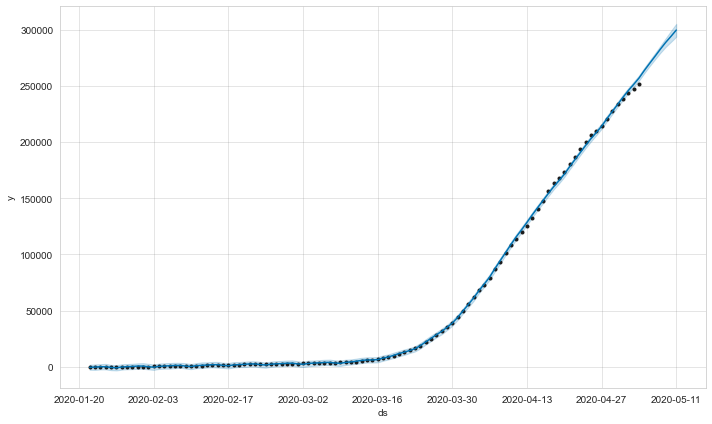

In [110]:
deaths_forecast_fig = deaths_model.plot(deaths_forecast)

/anaconda3/lib/python3.7/site-packages/fbprophet/forecaster.py:400: FutureWarning:

The pandas.datetime class is deprecated and will be removed from pandas in a future version. Import from datetime module instead.



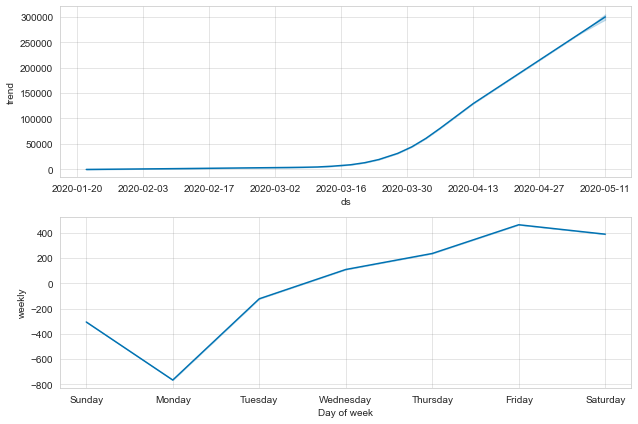

In [111]:
deaths_forecast_fig = deaths_model.plot_components(deaths_forecast)

In [112]:
from fbprophet.plot import plot_plotly
import plotly.offline as pa
pa.init_notebook_mode()

fig = plot_plotly(deaths_model, deaths_forecast)  # This returns a plotly Figure
pa.iplot(fig)

##### Modelling Recovered

In [113]:
recovered_model = Prophet(interval_width=0.95)
recovered_model.fit(global_recovered)

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/anaconda3/lib/python3.7/site-packages/fbprophet/forecaster.py:400: FutureWarning:

The pandas.datetime class is deprecated and will be removed from pandas in a future version. Import from datetime module instead.



In [114]:
predict_dates = recovered_model.make_future_dataframe(periods=7)
# predict_dates.tail()

In [115]:
recovered_forecast = recovered_model.predict(predict_dates)
recovered_forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()

,ds,yhat,yhat_lower,yhat_upper
106,2020-05-07,1.232111e+06,1.211886e+06,1.250335e+06
107,2020-05-08,1.266506e+06,1.246280e+06,1.286405e+06
108,2020-05-09,1.299985e+06,1.280121e+06,1.321019e+06
109,2020-05-10,1.332145e+06,1.309411e+06,1.353669e+06
110,2020-05-11,1.364612e+06,1.338501e+06,1.393327e+06


###### Plot predicted recovered cases over the next 7 days

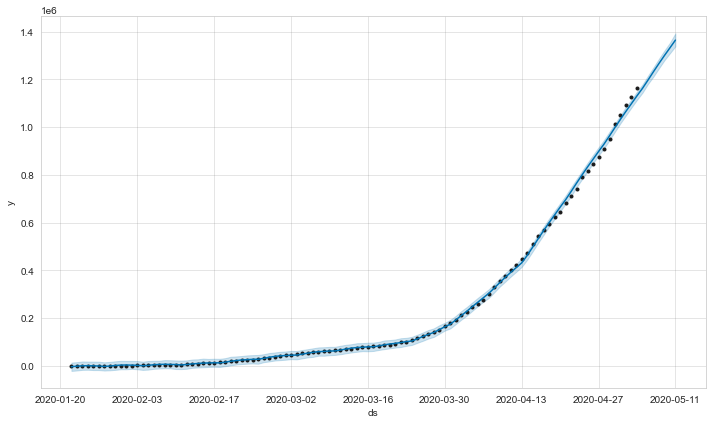

In [116]:
recovered_forecast_fig = recovered_model.plot(recovered_forecast)

/anaconda3/lib/python3.7/site-packages/fbprophet/forecaster.py:400: FutureWarning:

The pandas.datetime class is deprecated and will be removed from pandas in a future version. Import from datetime module instead.



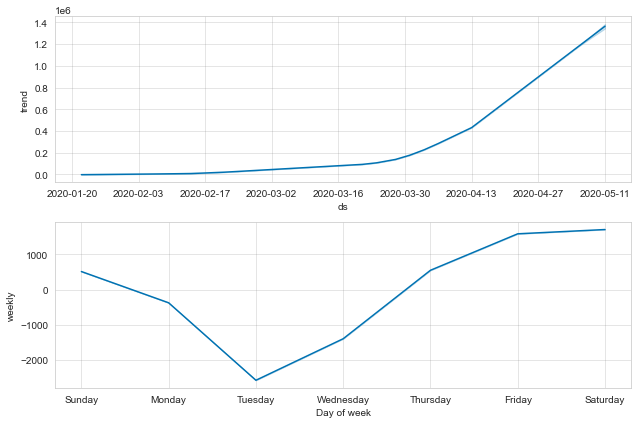

In [117]:
recovered_forecast_fig = recovered_model.plot_components(recovered_forecast)

In [118]:
from fbprophet.plot import plot_plotly
import plotly.offline as pa
pa.init_notebook_mode()

fig = plot_plotly(recovered_model, recovered_forecast)  # This returns a plotly Figure
pa.iplot(fig)